# Course materials Machine Learning for Neuroimaging

By Qing Wang

Adapted from the excellent [McGill QLSC 612 course](https://neurodatascience.github.io/QLS612-Overview/).

In [1]:
from sklearn import datasets

# This will return a 'Bunch' object
# see sklearn.utils.Bunch for details
diabetes = datasets.load_diabetes(as_frame=True)

# We can return information on the dataset
print(diabetes.DESCR)

# And view its contents
diabetes.data.head()

.. _diabetes_dataset:

Diabetes dataset
----------------

Ten baseline variables, age, sex, body mass index, average blood
pressure, and six blood serum measurements were obtained for each of n =
442 diabetes patients, as well as the response of interest, a
quantitative measure of disease progression one year after baseline.

**Data Set Characteristics:**

  :Number of Instances: 442

  :Number of Attributes: First 10 columns are numeric predictive values

  :Target: Column 11 is a quantitative measure of disease progression one year after baseline

  :Attribute Information:
      - age     age in years
      - sex
      - bmi     body mass index
      - bp      average blood pressure
      - s1      tc, total serum cholesterol
      - s2      ldl, low-density lipoproteins
      - s3      hdl, high-density lipoproteins
      - s4      tch, total cholesterol / HDL
      - s5      ltg, possibly log of serum triglycerides level
      - s6      glu, blood sugar level

Note: Each of these 1

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019907,-0.017646
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068332,-0.092204
2,0.085299,0.050680,0.044451,-0.005670,-0.045599,-0.034194,-0.032356,-0.002592,0.002861,-0.025930
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022688,-0.009362
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031988,-0.046641


In [2]:
from nilearn import datasets # example dataset
import nibabel as nib # lib for imaging data IO


development_dataset = datasets.fetch_development_fmri(n_subjects=30)

# Subset to just the first image
img = nib.load(development_dataset.func[0])
print("The dimension of the functional image of subject 1:")
img.shape

The dimension of the functional image of subject 1:


(50, 59, 50, 168)

/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



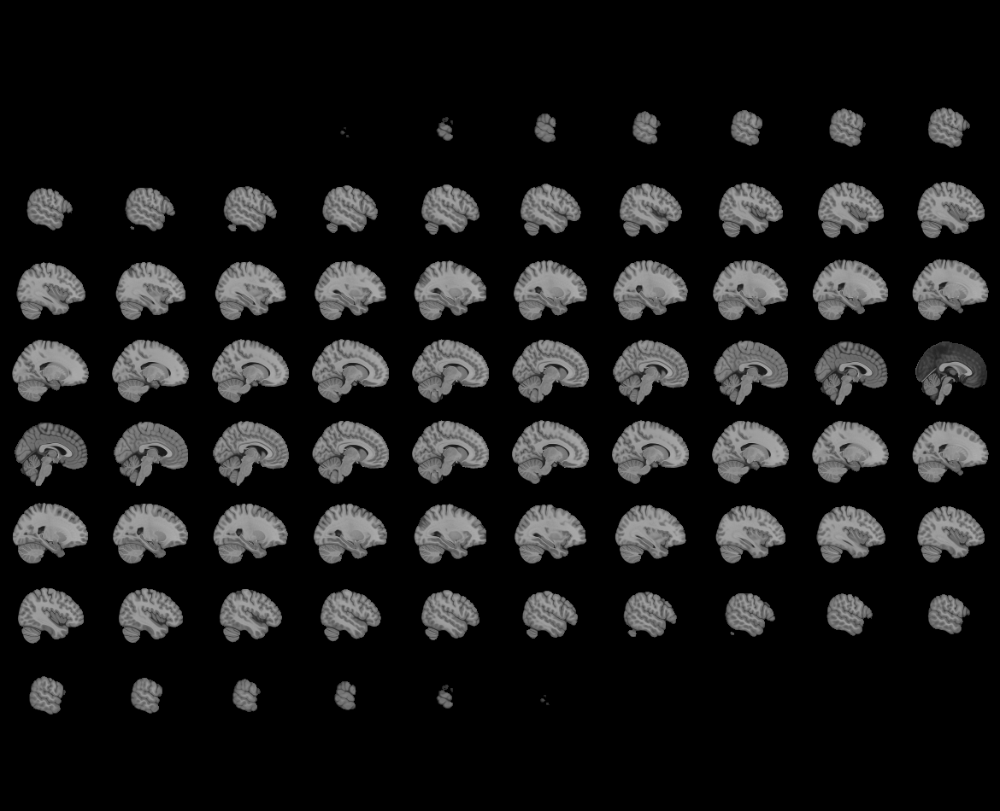
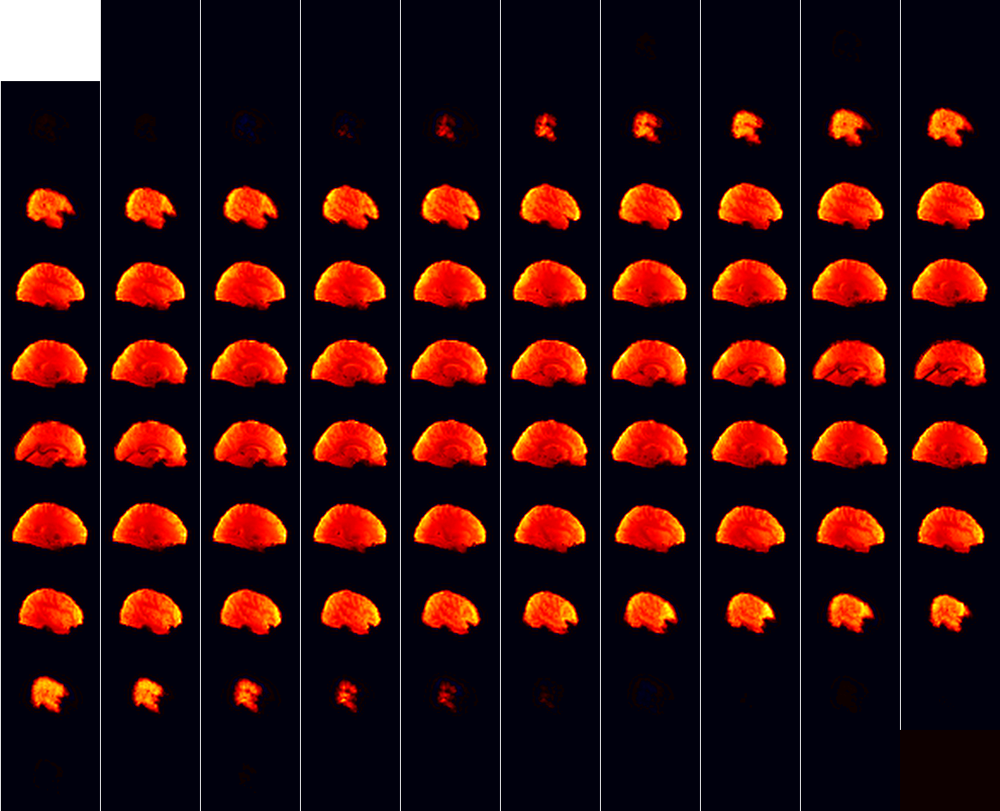

In [3]:
# Basic visualization of neuroimage 
import matplotlib.pyplot as plt
from nilearn import image
from nilearn import plotting

mean_image = image.mean_img(development_dataset.func[0])
plotting.view_img(mean_image, threshold=None)

MSDL has 39 ROIs, part of the following networks :
['Ant IPS' 'Aud' 'Basal' 'Cereb' 'Cing-Ins' 'D Att' 'DMN' 'Dors PCC'
 'L V Att' 'Language' 'Motor' 'Occ post' 'R V Att' 'Salience' 'Striate'
 'Temporal' 'Vis Sec'].


/opt/conda/lib/python3.9/site-packages/nilearn/plotting/displays/_axes.py:74: UserWarning: No contour levels were found within the data range.
  im = getattr(ax, type)(


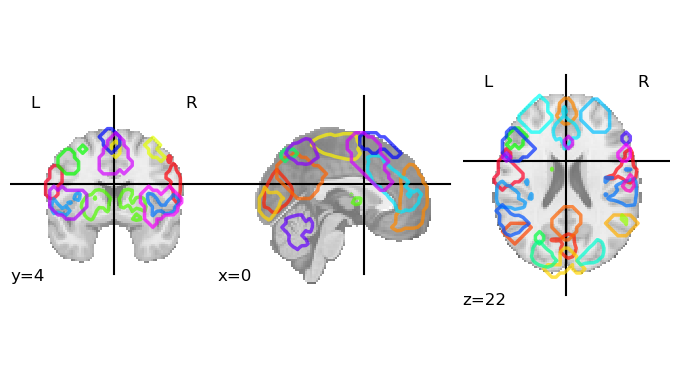

In [4]:
import numpy as np # dealing with data mat 

# import and visualize atlas
msdl_atlas = datasets.fetch_atlas_msdl()
msdl_coords = msdl_atlas.region_coords
n_regions = len(msdl_coords)

print(f'MSDL has {n_regions} ROIs, part of the following networks :\n{np.unique(msdl_atlas.networks)}.')
plotting.plot_prob_atlas(msdl_atlas.maps)

## The masker object: integrated preprocessing

![image](https://github.com/Vincent-wq/nilearn_course/blob/main/images/masking.jpg?raw=true)

In [5]:
# preproc and transform from individual space to atlas space
from nilearn import input_data

masker = input_data.NiftiMapsMasker(
    msdl_atlas.maps, resampling_target="data",
    t_r=2, detrend=True,
    low_pass=0.1, high_pass=0.01).fit()

In [6]:
# Do the transformation
roi_time_series = masker.transform(development_dataset.func[0])

print("The dimensions of data in atlas space:")
roi_time_series.shape

The dimensions of data in atlas space:


(168, 39)

In [7]:
# Dealing with confounders, will show latter
import pandas as pd
pd.read_table(development_dataset.confounds[0]).head(3)

,trans_x,trans_y,trans_z,rot_x,rot_y,rot_z,framewise_displacement,a_comp_cor_00,a_comp_cor_01,a_comp_cor_02,a_comp_cor_03,a_comp_cor_04,a_comp_cor_05,csf,white_matter
0,-0.000233,-0.076885,0.062321,0.000732,0.000352,0.000841,0.000000,-0.099871,-0.007286,0.001780,-0.008073,0.030945,-0.022393,439.699409,451.645460
1,-0.006187,-0.078395,0.056773,0.000112,0.000187,0.000775,0.055543,-0.019437,-0.042308,0.016735,-0.012099,0.088777,-0.006171,439.471640,451.103437
2,-0.000227,-0.069893,0.083102,0.000143,0.000364,0.000716,0.054112,0.009096,-0.053206,-0.030388,-0.052925,0.019922,0.014776,439.744498,450.981505


## Functional connectivity: ( Correlation)

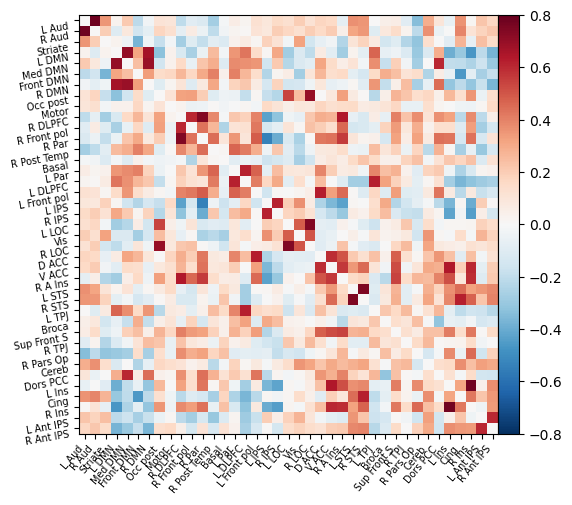

In [8]:
from nilearn.connectome import ConnectivityMeasure

correlation_measure = ConnectivityMeasure(kind='correlation') # choose the connectivity measure
correlation_matrix = correlation_measure.fit_transform([roi_time_series])[0]

# Considering confounders as well
corrected_roi_time_series = masker.transform(
    development_dataset.func[0], confounds=development_dataset.confounds[0])

corrected_correlation_matrix = correlation_measure.fit_transform(
    [corrected_roi_time_series])[0]

# Visualize 
np.fill_diagonal(corrected_correlation_matrix, 0)
plotting.plot_matrix(corrected_correlation_matrix, labels=msdl_atlas.labels,
                     vmax=0.8, vmin=-0.8, colorbar=True)

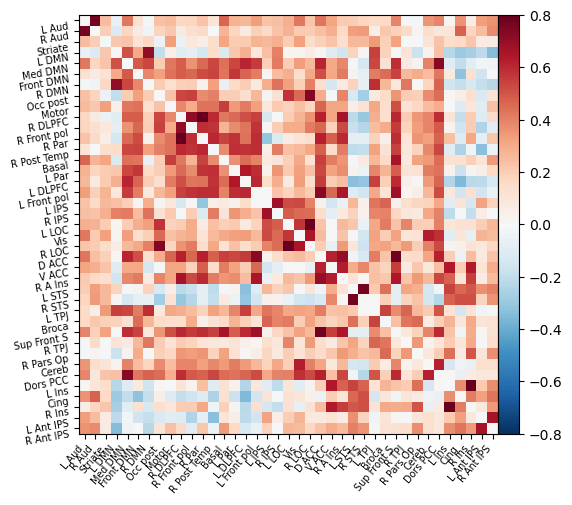

In [9]:
# The beautiful plotty 3D stuff
np.fill_diagonal(correlation_matrix, 0)
plotting.plot_matrix(correlation_matrix, labels=msdl_atlas.labels,
                     vmax=0.8, vmin=-0.8, colorbar=True)

plotting.view_connectome(corrected_correlation_matrix, edge_threshold=0.2,
                         node_coords=msdl_atlas.region_coords)

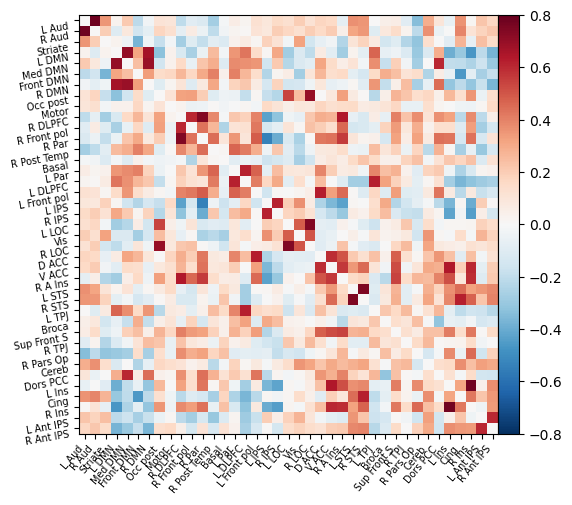

In [10]:
corrected_roi_time_series = masker.transform(
    development_dataset.func[0], confounds=development_dataset.confounds[0])
corrected_correlation_matrix = correlation_measure.fit_transform(
    [corrected_roi_time_series])[0]
np.fill_diagonal(corrected_correlation_matrix, 0)
plotting.plot_matrix(corrected_correlation_matrix, labels=msdl_atlas.labels,
                     vmax=0.8, vmin=-0.8, colorbar=True)

In [11]:
plotting.view_connectome(corrected_correlation_matrix, edge_threshold=0.2,
                         node_coords=msdl_atlas.region_coords)

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import (datasets, input_data, plotting)
from nilearn.connectome import ConnectivityMeasure

development_dataset = datasets.fetch_development_fmri(n_subjects=30)
msdl_atlas = datasets.fetch_atlas_msdl()

masker = input_data.NiftiMapsMasker(
    msdl_atlas.maps, resampling_target="data",
    t_r=2, detrend=True,
    low_pass=0.1, high_pass=0.01).fit()
correlation_measure = ConnectivityMeasure(kind='correlation')

## Full example: predict age group (child or adult) based on connectome (3 types of measures)
Now that we’ve seen how to create a connectome for an individual subject, we’re ready to think about how we can use this connectome in a machine learning analysis. We’ll keep working with the same development_dataset, but now we’d like to see if we can predict age group (i.e. whether a participant is a child or adult) based on their connectome, as defined by the functional connectivity matrix.

We’ll also explore whether we’re more or less accurate in our predictions based on how we define functional connectivity. In this example, we’ll consider three different different ways to define functional connectivity between our Multi-Subject Dictional Learning (MSDL) regions of interest (ROIs): correlation, partial correlation, and tangent space embedding.

To learn more about tangent space embedding and how it compares to standard correlations, we recommend [Dadi et al., 2019].

In [13]:
# This piece of code can take several minutes
children = []
pooled_subjects = []
groups = []  # child or adult

for func_file, confound_file, phenotypic in zip(
        development_dataset.func,
        development_dataset.confounds,
        development_dataset.phenotypic):

    time_series = masker.transform(func_file, confounds=confound_file)
    pooled_subjects.append(time_series)

    if phenotypic['Child_Adult'] == 'child':
        children.append(time_series)

    groups.append(phenotypic['Child_Adult'])

print('Data has {0} children.'.format(len(children)))


Data has 24 children.


In [14]:
correlation_matrices = correlation_measure.fit_transform(children)
print('Correlations of children are stacked in an array of shape {0}'
      .format(correlation_matrices.shape))

Correlations of children are stacked in an array of shape (24, 39, 39)


In [15]:
mean_correlation_matrix = correlation_measure.mean_
print('Mean correlation has shape {0}.'.format(mean_correlation_matrix.shape))

Mean correlation has shape (39, 39).


example subject connectivity matrices


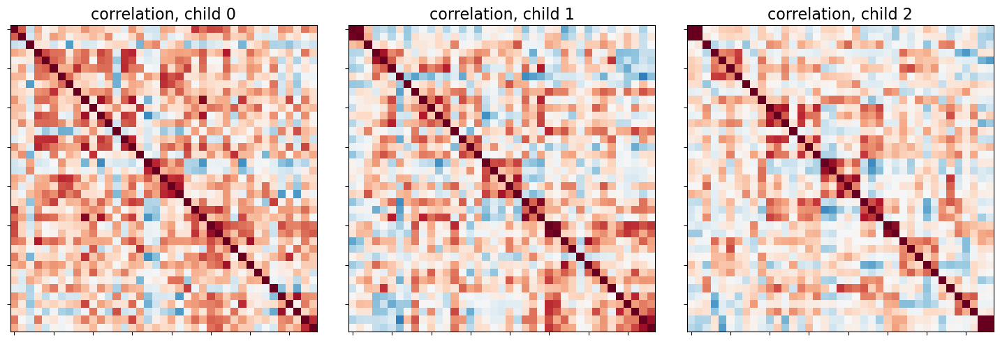

In [16]:
print("example subject connectivity matrices")
_, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, (matrix, ax) in enumerate(zip(correlation_matrices, axes)):
    plotting.plot_matrix(matrix, colorbar=False, axes=ax,
                         vmin=-0.8, vmax=0.8,
                         title='correlation, child {}'.format(i))

In [17]:
print("The mean connectome in 3D:")
plotting.view_connectome(mean_correlation_matrix, msdl_atlas.region_coords,
                         edge_threshold=0.2,
                         title='mean connectome over all children')

The mean connectome in 3D:


## Another FC measure choice: partial correlation

Rather than looking at the correlation-defined functional connectivity matrix, we can also study partial correlation coefficients.

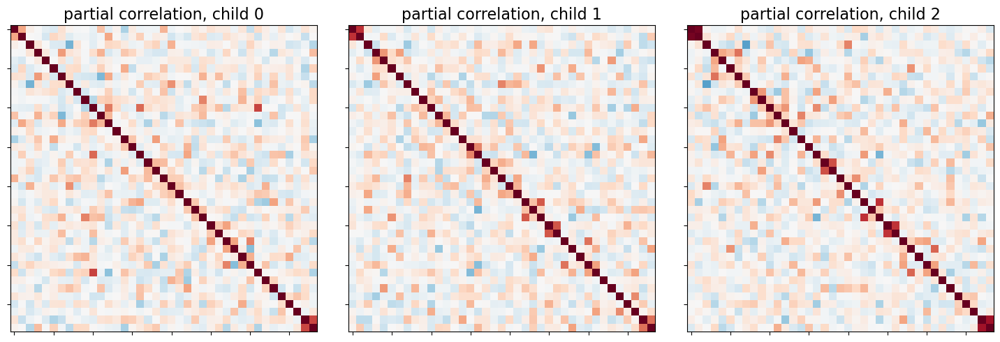

In [18]:
partial_correlation_measure = ConnectivityMeasure(kind='partial correlation')
partial_correlation_matrices = partial_correlation_measure.fit_transform(
    children)

_, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, (matrix, ax) in enumerate(zip(partial_correlation_matrices, axes)):
    plotting.plot_matrix(matrix, colorbar=False, axes=ax,
                         vmin=-0.8, vmax=0.8,
                         title='partial correlation, child {}'.format(i))

plotting.view_connectome(
    partial_correlation_measure.mean_, msdl_atlas.region_coords,
    edge_threshold=0.2,
    title='mean partial correlation over all children')

## FC: Tangent space embedding

An alternative method to both correlations and partial correlation is tangent space embedding. Tangent space embedding uses both correlations and partial correlations to capture reproducible connectivity patterns at the group-level.

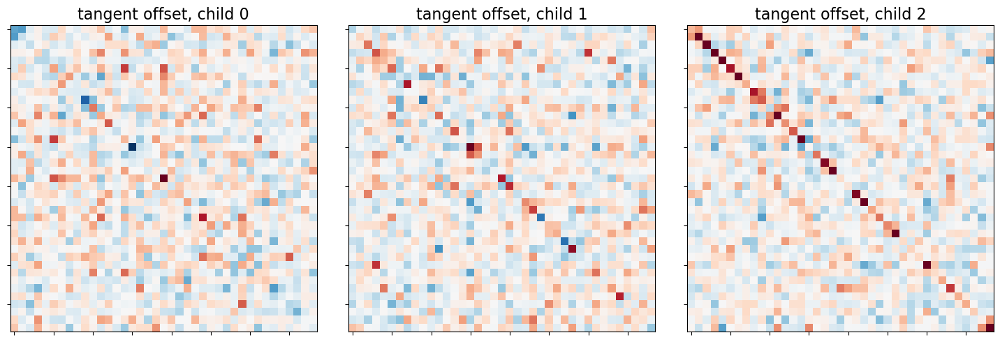

In [19]:
tangent_measure = ConnectivityMeasure(kind='tangent')
tangent_matrices = tangent_measure.fit_transform(children)

_, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, (matrix, ax) in enumerate(zip(tangent_matrices, axes)):
    plotting.plot_matrix(matrix, colorbar=False, axes=ax,
                         vmin=-0.8, vmax=0.8,
                         title='tangent offset, child {}'.format(i))


## Using connectivity in a classification task (childern VS adults)

We can use these connectivity matrices as features in a classification analysis to distinguish children from adults. This classification analysis can be implmented directly in scikit-learn, including all of the important considerations like cross-validation and measuring classification accuracy.

First, we’ll randomly split participants into training and testing sets 15 times. StratifiedShuffleSplit allows us to preserve the proportion of children-to-adults in the test set. We’ll also compute classification accuracies for each of the kinds of functional connectivity we’ve identified: correlation, partial correlation, and tangent space embedding.

In [20]:
from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.svm import LinearSVC

kinds = ['correlation', 'partial correlation', 'tangent']
_, classes = np.unique(groups, return_inverse=True)
cv = StratifiedShuffleSplit(n_splits=15, random_state=0, test_size=5) # 15 split
pooled_subjects = np.asarray(pooled_subjects)

In [21]:
scores = {}
for kind in kinds:
    scores[kind] = []
    for train, test in cv.split(pooled_subjects, classes):
        # *ConnectivityMeasure* can output the estimated subjects coefficients
        # as a 1D arrays through the parameter *vectorize*.
        connectivity = ConnectivityMeasure(kind=kind, vectorize=True)
        # build vectorized connectomes for subjects in the train set
        connectomes = connectivity.fit_transform(pooled_subjects[train])
        # fit the classifier
        classifier = LinearSVC().fit(connectomes, classes[train])
        # make predictions for the left-out test subjects
        predictions = classifier.predict(
            connectivity.transform(pooled_subjects[test]))
        # store the accuracy for this cross-validation fold
        scores[kind].append(accuracy_score(classes[test], predictions))

/opt/conda/lib/python3.9/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/svm/_classes.py:32: FutureWar

Summarize the results:


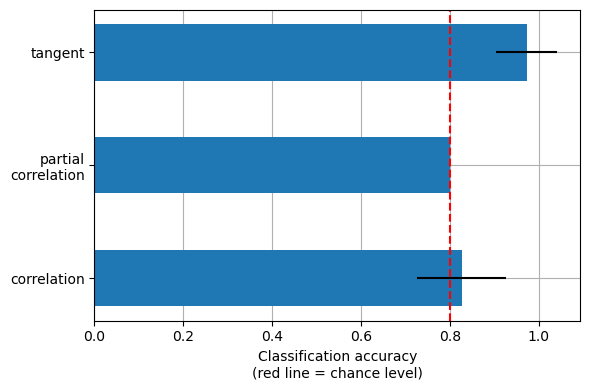

In [22]:
mean_scores = [np.mean(scores[kind]) for kind in kinds]
scores_std = [np.std(scores[kind]) for kind in kinds]

print("Summarize the results:")
plt.figure(figsize=(6, 4))
positions = np.arange(len(kinds)) * .1 + .1
plt.barh(positions, mean_scores, align='center', height=.05, xerr=scores_std)
yticks = [k.replace(' ', '\n') for k in kinds]
plt.yticks(positions, yticks)
plt.gca().grid(True)
plt.gca().set_axisbelow(True)
plt.gca().axvline(.8, color='red', linestyle='--')
plt.xlabel('Classification accuracy\n(red line = chance level)')
plt.tight_layout()

# To be continued...